In [ ]:
!pip install albumentations==0.4.6

In [5]:
import os
import torch
import tqdm
import numpy as np
import pandas as pd
import albumentations as A
from PIL import Image
import torchvision.transforms as transforms
import torch.nn as nn
import matplotlib.pyplot as plt
from albumentations.pytorch import ToTensorV2
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset

In [8]:
!nvidia-smi
# training the NN on a small dataset due to GPU constraints

Thu Feb 25 12:29:36 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.39       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   47C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [9]:
class LoadDataset(Dataset):
    def __init__(self, img_dir, mask_dir, objects_file, transform):
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.images = sorted(next(os.walk(img_dir))[2])
        self.masks = sorted(next(os.walk(mask_dir))[2])
        self.objects = pd.read_csv(objects_file, delimiter = "\t")["Name"].tolist()

    def __len__(self):
        return len(self.images)

    def __getitem__(self, index):
        image = Image.open(f"{self.img_dir}/{self.images[index]}").convert("RGB")
        mask = Image.open(f"{self.mask_dir}/{self.masks[index]}")
        image = np.array(image, dtype=np.uint8)
        mask = np.array(mask, dtype=np.uint8)

        if self.transform is not None:
            augmentations = self.transform(image=image, mask=mask)
            image = augmentations["image"]
            mask = augmentations["mask"]

        return image, mask

In [10]:
lr = 1e-4
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
batch_size = 16
epochs = 141
img_height = 160
img_width = 240

In [11]:
device

device(type='cuda')

In [12]:
train_transform = A.Compose([A.Resize(height=img_height, width=img_width), 
                            #  A.Rotate(limit=35, p=1.0), 
                            #  A.HorizontalFlip(p=0.5), 
                            #  A.VerticalFlip(p=0.1),
                             A.Normalize(mean=[0.0, 0.0, 0.0],
                                         std=[1.0, 1.0, 1.0],
                                         max_pixel_value=255.0),
                             ToTensorV2()])

val_transform = A.Compose([A.Resize(height=img_height, width=img_width), 
                           A.Normalize(mean=[0.0, 0.0, 0.0],
                                       std=[1.0, 1.0, 1.0], 
                                       max_pixel_value=255.0),
                           ToTensorV2()])

In [13]:
train_data = LoadDataset("images/", "annotations/", "objectInfo150.txt", train_transform)
len(train_data)

200

In [14]:
train_batches = DataLoader(train_data, batch_size=batch_size, num_workers=2, pin_memory=True, shuffle=True)
# val_batches = DataLoader(val_data, batch_size=batch_size, num_workers=2, pin_memory=True, shuffle=False)

In [15]:
len(train_batches)

13

In [16]:
img, msk = train_data[42]
img.shape, msk.shape

(torch.Size([3, 160, 240]), torch.Size([160, 240]))

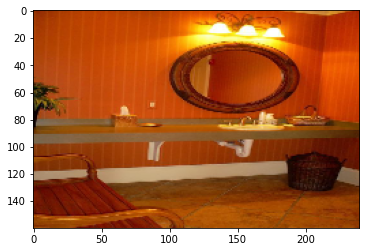

In [17]:
plt.imshow(img.permute(1, 2, 0))

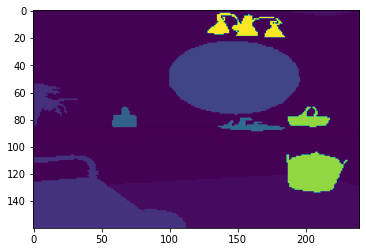

In [18]:
plt.imshow(msk)

In [19]:
def get_objects(msk):
    obj = []
    for i in msk.unique():
        if i == 0:
            continue
        obj.append(train_data.objects[i - 1])
    return obj

In [20]:
get_objects(msk)

['wall',
 'floor, flooring',
 'ceiling',
 'plant, flora, plant life',
 'chair',
 'mirror',
 'box',
 'sink',
 'basket, handbasket',
 'sconce']

In [21]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Sequential(nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False),
                                  nn.BatchNorm2d(out_channels), 
                                  nn.ReLU(inplace=True))
    def forward(self, x):
        return self.conv(x)

In [22]:
class SegNetDown2(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv1 = ConvBlock(in_channels, out_channels)
        self.conv2 = ConvBlock(out_channels, out_channels)
        self.pool = nn.MaxPool2d(2, 2, return_indices=True)

    def forward(self, inputs):
        outputs = self.conv1(inputs)
        outputs = self.conv2(outputs)
        unpooled_shape = outputs.shape
        outputs, indices = self.pool(outputs)
        return outputs, indices, unpooled_shape


class SegNetDown3(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv1 = ConvBlock(in_channels, out_channels)
        self.conv2 = ConvBlock(out_channels, out_channels)
        self.conv3 = ConvBlock(out_channels, out_channels)
        self.pool = nn.MaxPool2d(2, 2, return_indices=True)

    def forward(self, inputs):
        outputs = self.conv1(inputs)
        outputs = self.conv2(outputs)
        outputs = self.conv3(outputs)
        unpooled_shape = outputs.shape
        outputs, indices = self.pool(outputs)
        return outputs, indices, unpooled_shape

In [23]:
class SegNetUp2(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.unpool = nn.MaxUnpool2d(2, 2)
        self.conv1 = ConvBlock(in_channels, in_channels)
        self.conv2 = ConvBlock(in_channels, out_channels)

    def forward(self, inputs, indices, output_shape):
        outputs = self.unpool(input=inputs, indices=indices, output_size=output_shape)
        outputs = self.conv1(outputs)
        outputs = self.conv2(outputs)
        return outputs

class SegNetUp3(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.unpool = nn.MaxUnpool2d(2, 2)
        self.conv1 = ConvBlock(in_channels, in_channels)
        self.conv2 = ConvBlock(in_channels, in_channels)
        self.conv3 = ConvBlock(in_channels, out_channels)

    def forward(self, inputs, indices, output_shape):
        outputs = self.unpool(input=inputs, indices=indices, output_size=output_shape)
        outputs = self.conv1(outputs)
        outputs = self.conv2(outputs)
        outputs = self.conv3(outputs)
        return outputs

In [24]:
class SegNet(nn.Module):
    def __init__(self, in_channels=3, n_classes=151):
        super().__init__()
        self.down1 = SegNetDown2(in_channels, 64)
        self.down2 = SegNetDown2(64, 128)
        self.down3 = SegNetDown3(128, 256)
        self.down4 = SegNetDown3(256, 512)
        self.down5 = SegNetDown3(512, 512)

        self.up5 = SegNetUp3(512, 512)
        self.up4 = SegNetUp3(512, 256)
        self.up3 = SegNetUp3(256, 128)
        self.up2 = SegNetUp2(128, 64)
        self.up1 = SegNetUp2(64, n_classes)

    def forward(self, inputs):
        down1, indices1, unpool_shape1 = self.down1(inputs)
        down2, indices2, unpool_shape2 = self.down2(down1)
        down3, indices3, unpool_shape3 = self.down3(down2)
        down4, indices4, unpool_shape4 = self.down4(down3)
        down5, indices5, unpool_shape5 = self.down5(down4)

        up5 = self.up5(down5, indices5, unpool_shape5)
        up4 = self.up4(up5, indices4, unpool_shape4)
        up3 = self.up3(up4, indices3, unpool_shape3)
        up2 = self.up2(up3, indices2, unpool_shape2)
        up1 = self.up1(up2, indices1, unpool_shape1)
        return up1

In [25]:
net = SegNet().to(device)

In [26]:
x = train_data[42][0].unsqueeze(0).to(device)
y = net(x)
x.shape, y.shape

(torch.Size([1, 3, 160, 240]), torch.Size([1, 151, 160, 240]))

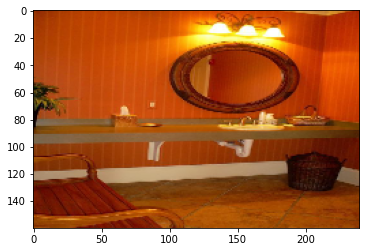

In [27]:
plt.imshow(x[0].permute(1, 2, 0).cpu())

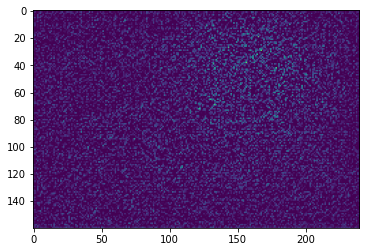

In [28]:
plt.imshow(y[0, 0, :, :].detach().cpu())

In [29]:
opt = torch.optim.Adam(net.parameters(), lr)
def loss_fn(input, target):
    n, c, h, w = input.shape
    nt, ht, wt = target.shape
    input = input.transpose(1, 2).transpose(2, 3).contiguous().view(-1, c)
    target = target.view(-1)
    loss = F.cross_entropy(input, target, ignore_index=250)
    return loss

def get_accuracy(preds, y):
    preds = preds.softmax(1).argmax(1)
    num_correct = preds.eq(y).sum()
    num_pixels = torch.numel(y)
    return num_correct / num_pixels

def display_images(X, preds, y):
    print("Displaying images:")
    print("")
    preds = preds.softmax(1).argmax(1)
    for i in range(5):
        plt.imshow(X[i].permute(1, 2, 0).cpu())
        plt.show()
        plt.imshow(preds[i].cpu())
        plt.show()
        plt.imshow(y[i].cpu())
        plt.show()
        print("")

In [30]:
def loop(batches, net, is_train):
    batch_losses = []
    batch_accs = []
    if is_train:
        print("Train Loop:")
        print("")
        net.train()
    else:
        print("Validation Loop:")
        print("")
        net.eval()

    for X, y in tqdm.tqdm(batches, total=len(batches)):
        X = X.to(device)
        y = y.long().to(device)
        with torch.set_grad_enabled(is_train):
            preds = net(X)
            loss = loss_fn(preds, y)  
            acc = get_accuracy(preds, y)
        if is_train:
            opt.zero_grad()
            loss.backward()
            opt.step()

        batch_losses.append(loss.item())
        batch_accs.append(acc)

    if epoch % 5 == 0:
        display_images(X, preds.detach(), y)
    print("")
    print("")
    return sum(batch_losses) / len(batch_losses), sum(batch_accs) / len(batch_accs)

  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 69 | train_loss: 2.2306 | train_acc: 0.7526

Train Loop:



100%|██████████| 13/13 [00:07<00:00,  1.73it/s]


Displaying images:



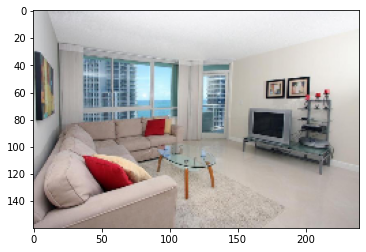

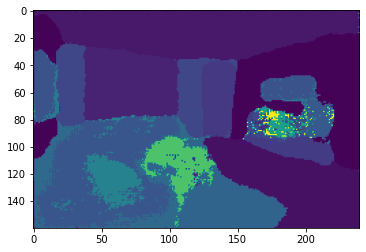

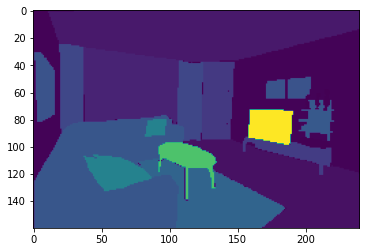

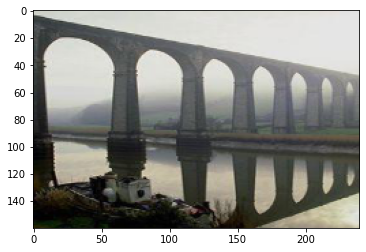

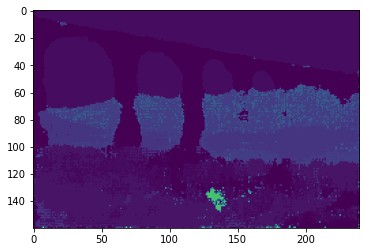

...

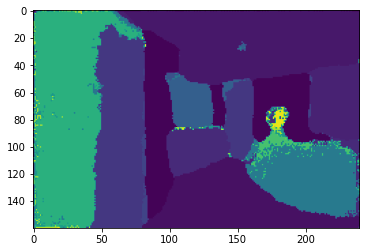

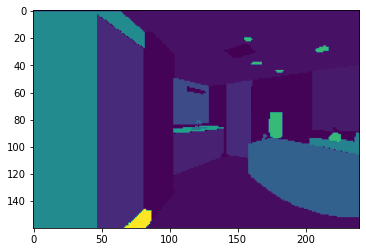

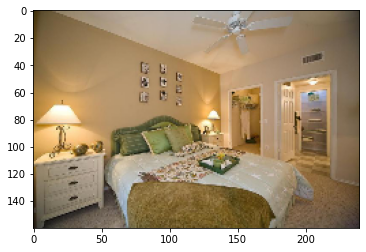

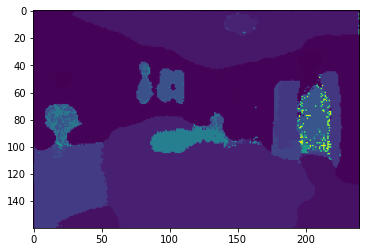

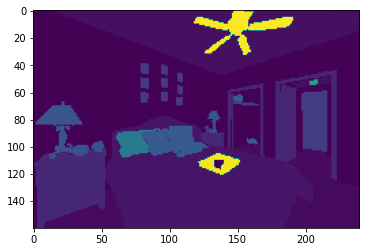

  0%|          | 0/13 [00:00<?, ?it/s]




epoch: 70 | train_loss: 2.1607 | train_acc: 0.7656

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 71 | train_loss: 2.1343 | train_acc: 0.7735

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 72 | train_loss: 2.2284 | train_acc: 0.7606

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 73 | train_loss: 2.1708 | train_acc: 0.7646

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 74 | train_loss: 2.1323 | train_acc: 0.7717

Train Loop:



100%|██████████| 13/13 [00:07<00:00,  1.72it/s]


Displaying images:



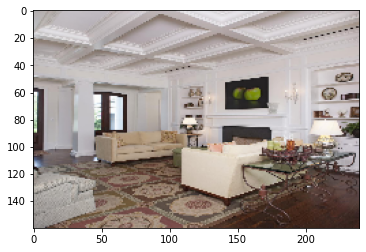

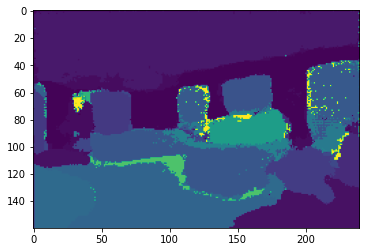

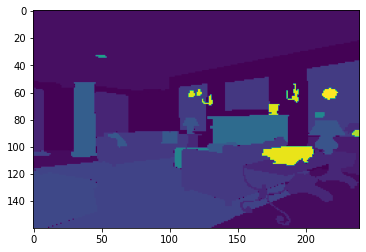

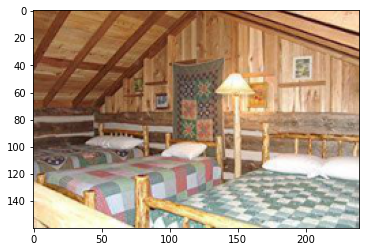

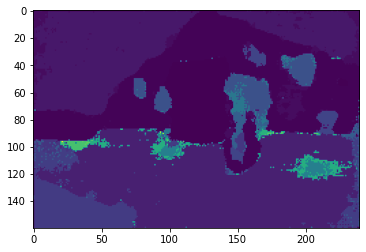

...

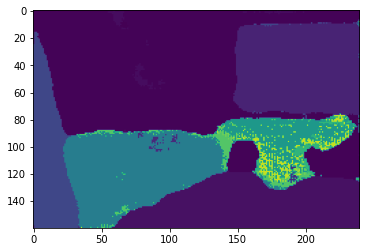

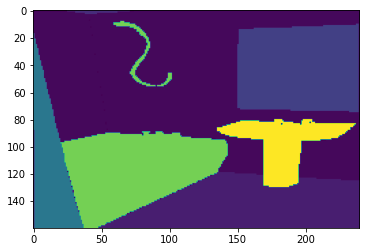

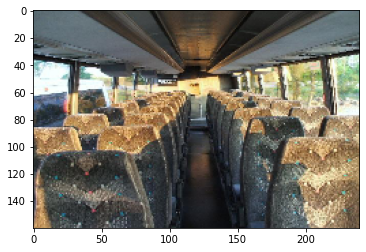

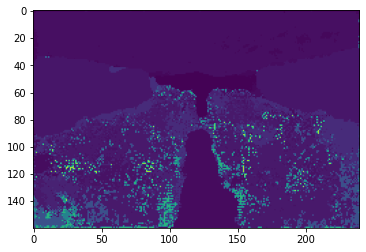

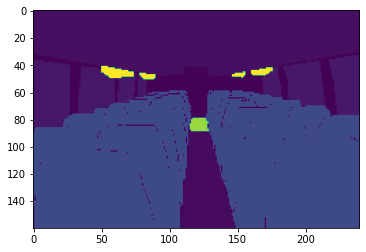

  0%|          | 0/13 [00:00<?, ?it/s]




epoch: 75 | train_loss: 2.0799 | train_acc: 0.7874

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 76 | train_loss: 2.0387 | train_acc: 0.7967

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 77 | train_loss: 2.0493 | train_acc: 0.7937

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 78 | train_loss: 2.0335 | train_acc: 0.8085

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 79 | train_loss: 2.0290 | train_acc: 0.8020

Train Loop:



100%|██████████| 13/13 [00:07<00:00,  1.75it/s]


Displaying images:



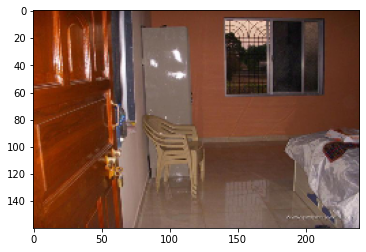

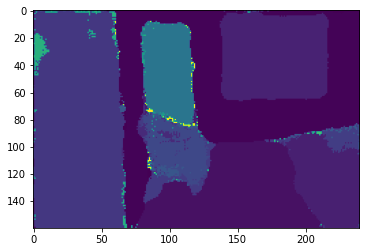

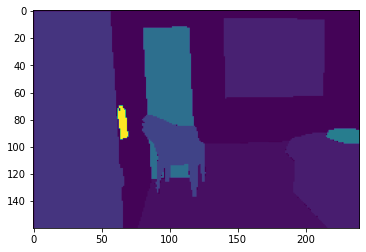

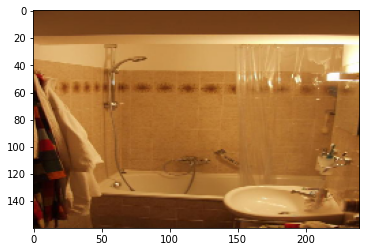

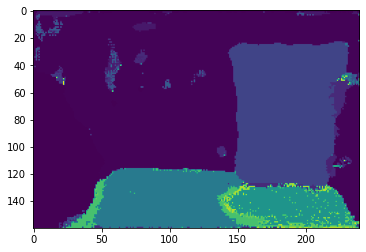

...

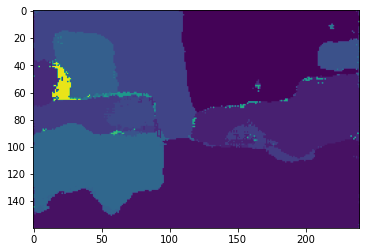

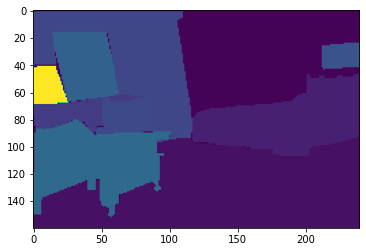

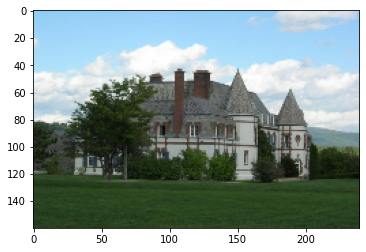

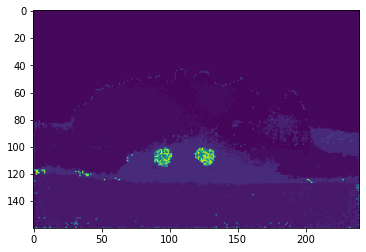

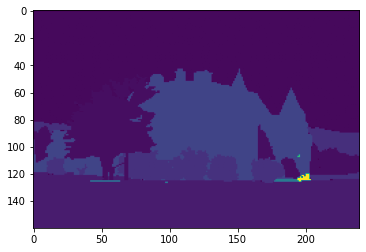

  0%|          | 0/13 [00:00<?, ?it/s]




epoch: 80 | train_loss: 2.0057 | train_acc: 0.8166

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 81 | train_loss: 1.9995 | train_acc: 0.8130

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 82 | train_loss: 2.0096 | train_acc: 0.8082

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 83 | train_loss: 2.0958 | train_acc: 0.7857

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 84 | train_loss: 2.0604 | train_acc: 0.7882

Train Loop:



100%|██████████| 13/13 [00:07<00:00,  1.73it/s]


Displaying images:



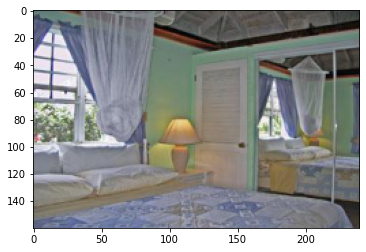

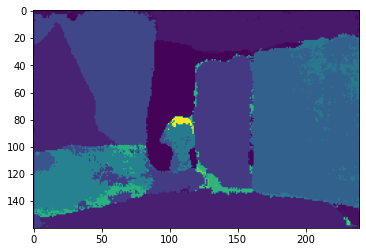

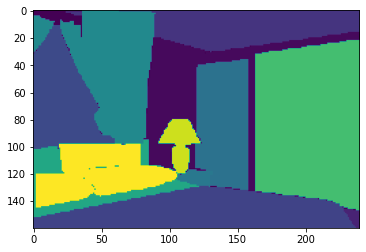

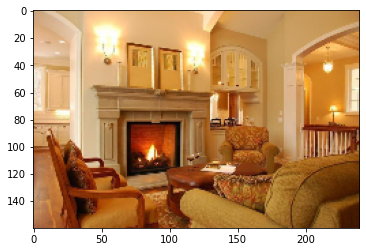

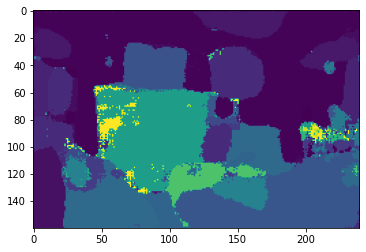

...

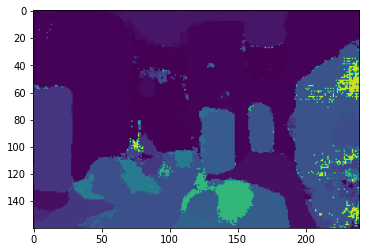

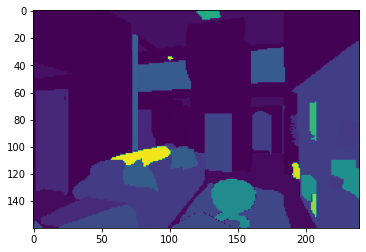

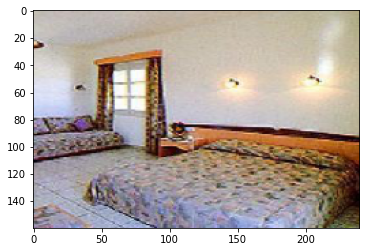

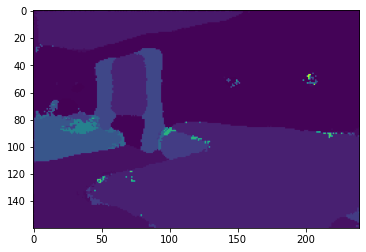

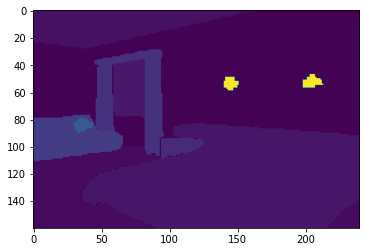

  0%|          | 0/13 [00:00<?, ?it/s]




epoch: 85 | train_loss: 1.9936 | train_acc: 0.8005

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 86 | train_loss: 2.0087 | train_acc: 0.7950

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 87 | train_loss: 1.9922 | train_acc: 0.8029

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 88 | train_loss: 1.9610 | train_acc: 0.8173

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 89 | train_loss: 1.9474 | train_acc: 0.8135

Train Loop:



100%|██████████| 13/13 [00:07<00:00,  1.72it/s]


Displaying images:



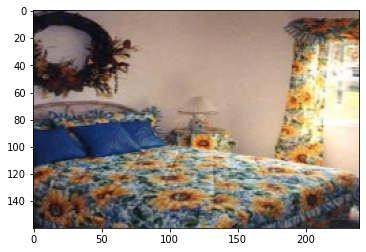

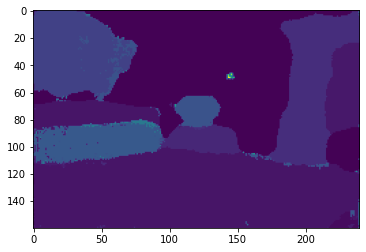

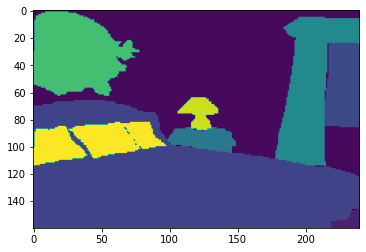

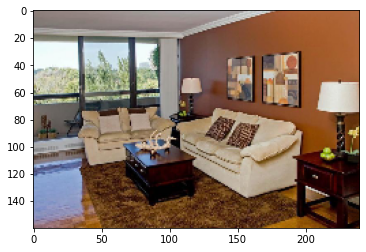

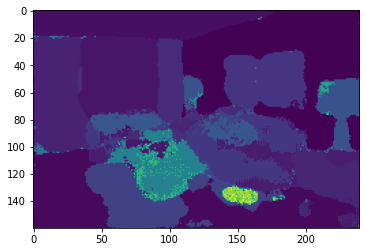

...

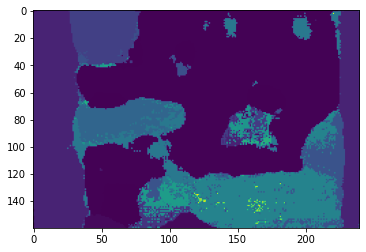

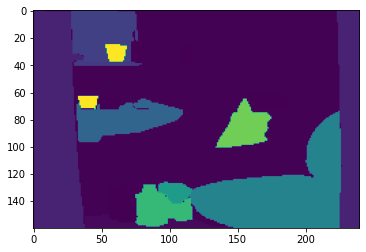

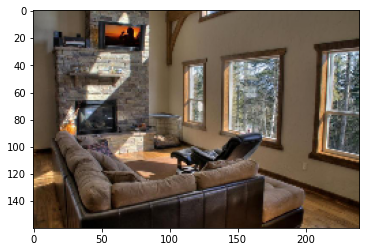

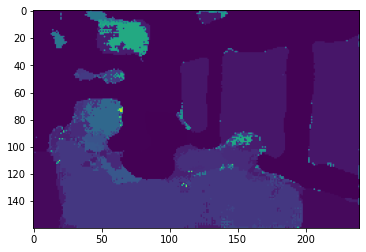

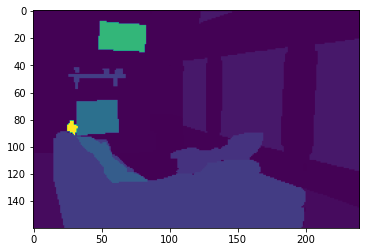

  0%|          | 0/13 [00:00<?, ?it/s]




epoch: 90 | train_loss: 1.9447 | train_acc: 0.8147

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 91 | train_loss: 1.9494 | train_acc: 0.8172

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 92 | train_loss: 1.9464 | train_acc: 0.8210

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 93 | train_loss: 1.8614 | train_acc: 0.8405

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 94 | train_loss: 1.8531 | train_acc: 0.8411

Train Loop:



100%|██████████| 13/13 [00:07<00:00,  1.72it/s]


Displaying images:



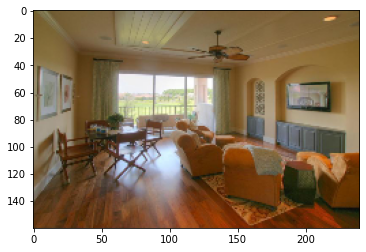

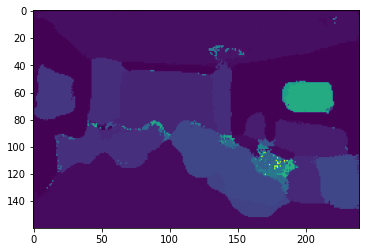

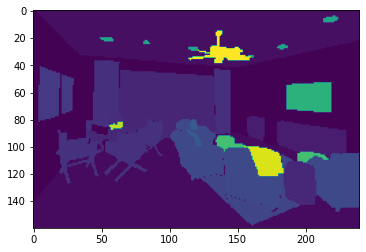

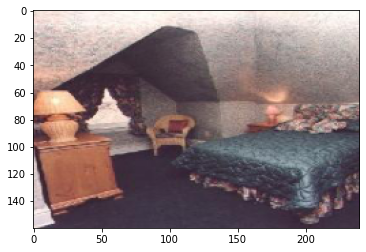

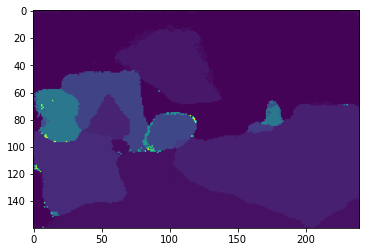

...

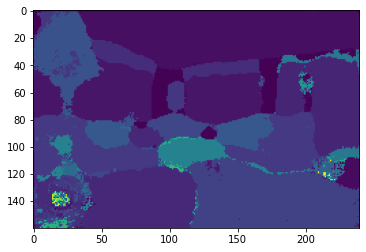

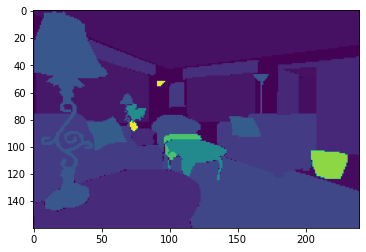

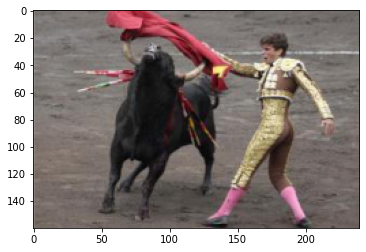

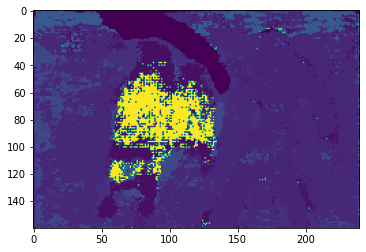

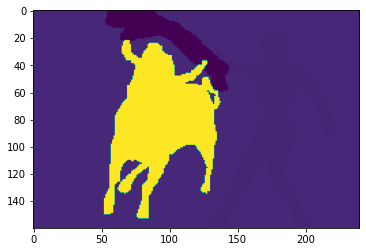

  0%|          | 0/13 [00:00<?, ?it/s]




epoch: 95 | train_loss: 1.8438 | train_acc: 0.8397

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 96 | train_loss: 1.8100 | train_acc: 0.8484

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 97 | train_loss: 1.8026 | train_acc: 0.8567

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 98 | train_loss: 1.7853 | train_acc: 0.8618

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 99 | train_loss: 1.7947 | train_acc: 0.8612

Train Loop:



100%|██████████| 13/13 [00:07<00:00,  1.74it/s]


Displaying images:



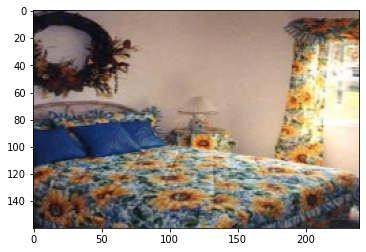

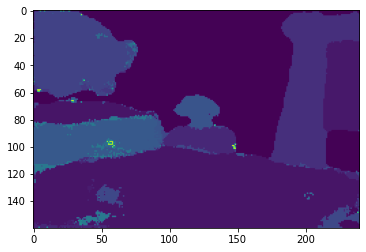

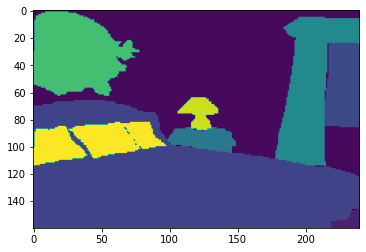

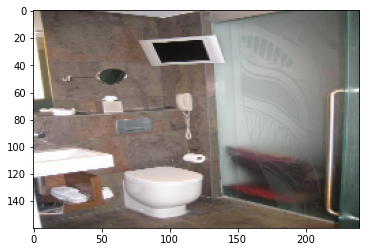

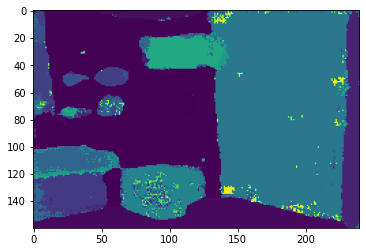

...

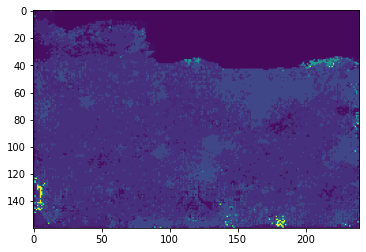

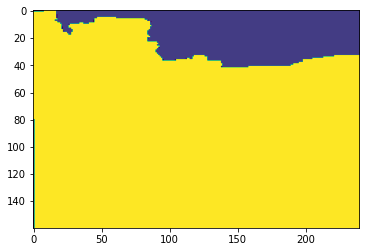

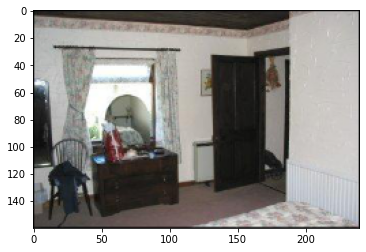

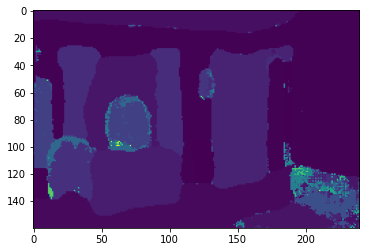

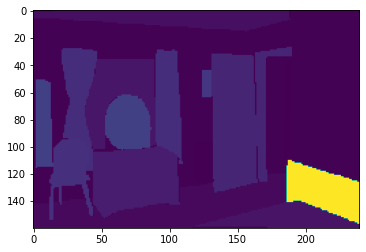

  0%|          | 0/13 [00:00<?, ?it/s]




epoch: 100 | train_loss: 1.7835 | train_acc: 0.8617

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 101 | train_loss: 1.7328 | train_acc: 0.8636

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 102 | train_loss: 1.7283 | train_acc: 0.8659

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 103 | train_loss: 1.7557 | train_acc: 0.8638

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 104 | train_loss: 1.7331 | train_acc: 0.8721

Train Loop:



100%|██████████| 13/13 [00:07<00:00,  1.74it/s]


Displaying images:



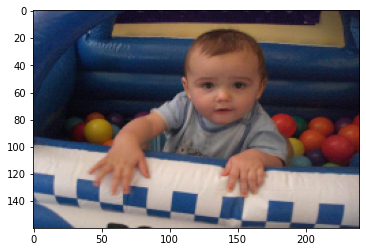

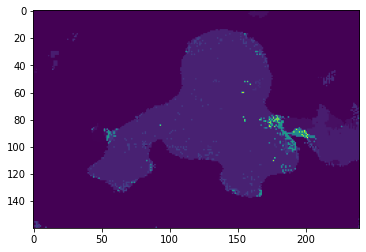

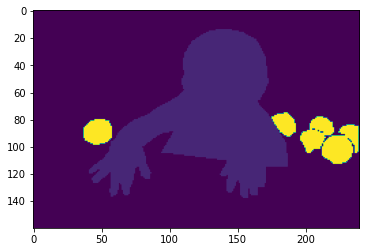

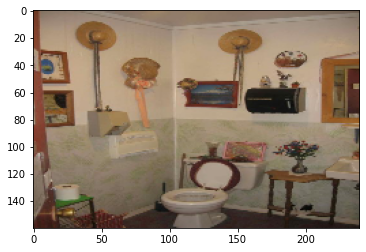

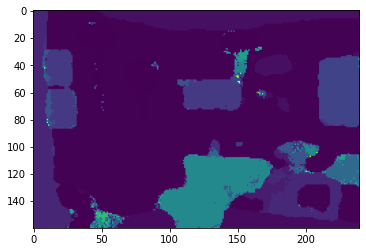

...

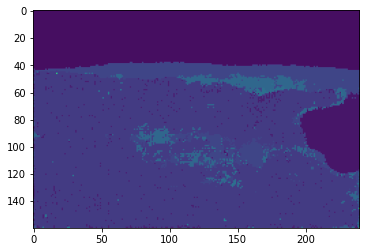

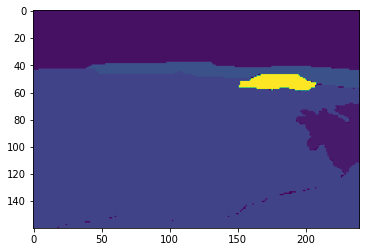

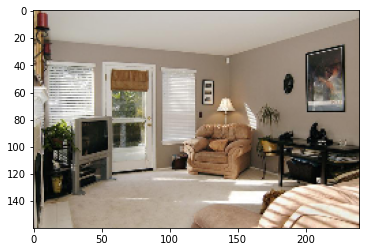

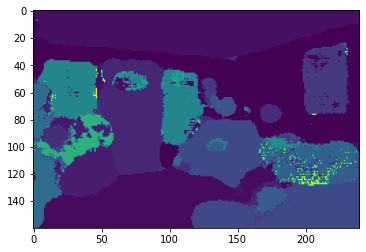

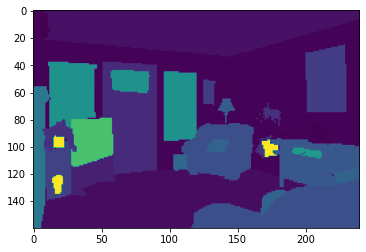

  0%|          | 0/13 [00:00<?, ?it/s]




epoch: 105 | train_loss: 1.7499 | train_acc: 0.8630

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 106 | train_loss: 1.7223 | train_acc: 0.8696

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 107 | train_loss: 1.7118 | train_acc: 0.8749

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 108 | train_loss: 1.6718 | train_acc: 0.8783

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 109 | train_loss: 1.7175 | train_acc: 0.8751

Train Loop:



100%|██████████| 13/13 [00:07<00:00,  1.72it/s]


Displaying images:



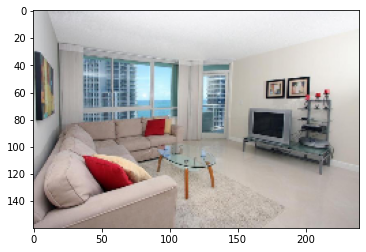

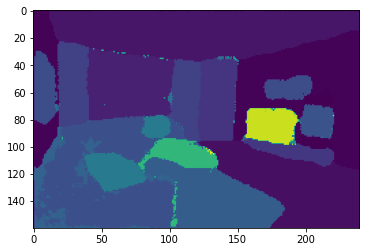

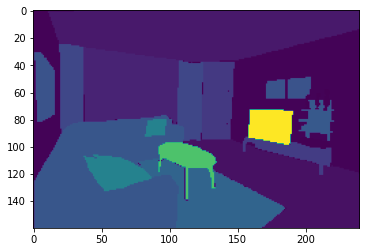

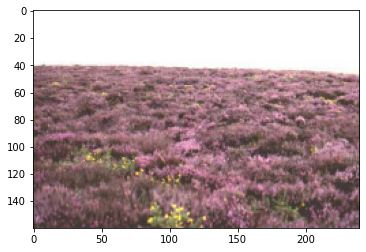

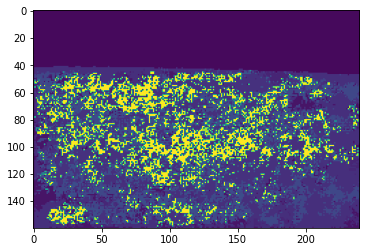

...

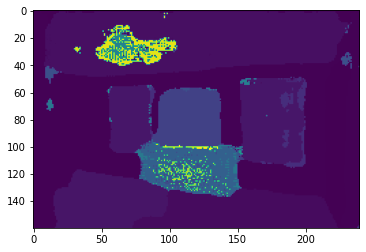

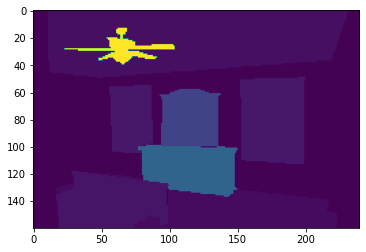

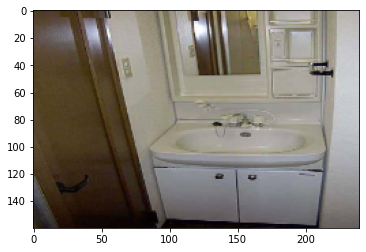

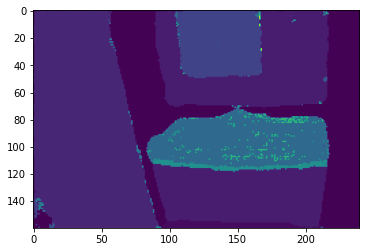

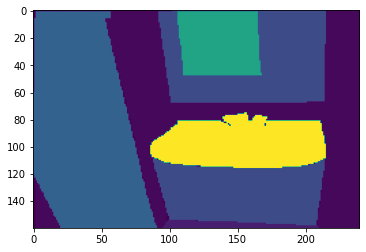

  0%|          | 0/13 [00:00<?, ?it/s]




epoch: 110 | train_loss: 1.6775 | train_acc: 0.8781

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 111 | train_loss: 1.6717 | train_acc: 0.8795

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 112 | train_loss: 1.6695 | train_acc: 0.8809

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 113 | train_loss: 1.6637 | train_acc: 0.8765

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 114 | train_loss: 1.6643 | train_acc: 0.8832

Train Loop:



100%|██████████| 13/13 [00:07<00:00,  1.70it/s]


Displaying images:



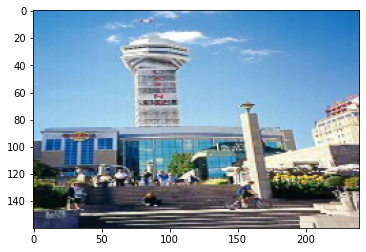

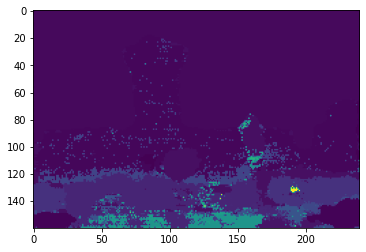

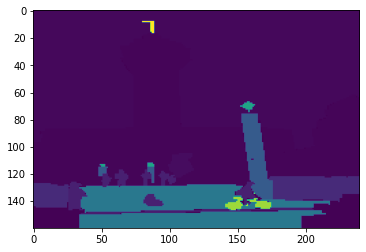

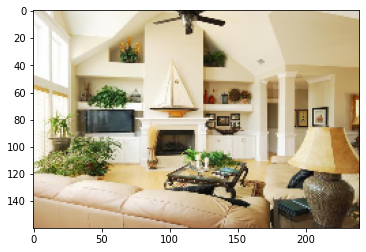

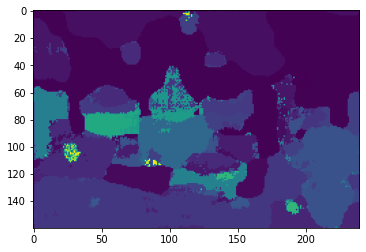

...

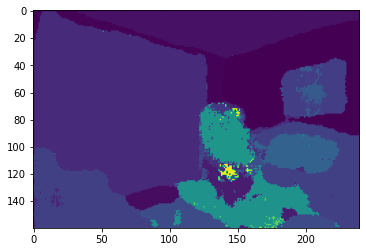

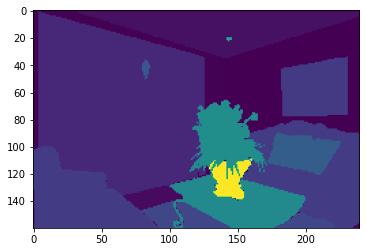

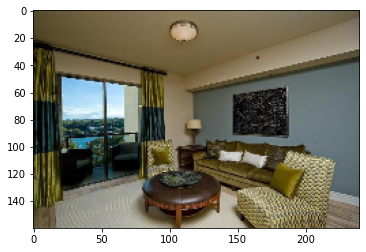

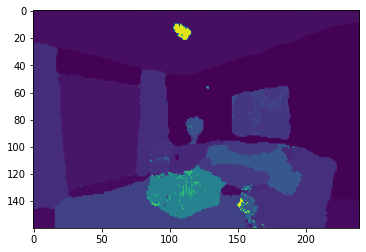

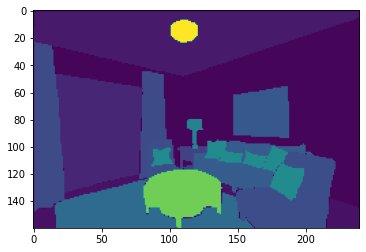

  0%|          | 0/13 [00:00<?, ?it/s]




epoch: 115 | train_loss: 1.6533 | train_acc: 0.8818

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 116 | train_loss: 1.6502 | train_acc: 0.8819

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 117 | train_loss: 1.6335 | train_acc: 0.8837

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 118 | train_loss: 1.5976 | train_acc: 0.8910

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 119 | train_loss: 1.5804 | train_acc: 0.8912

Train Loop:



100%|██████████| 13/13 [00:07<00:00,  1.71it/s]


Displaying images:



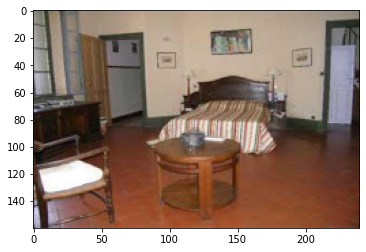

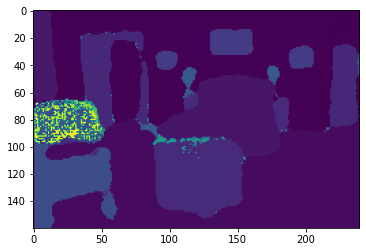

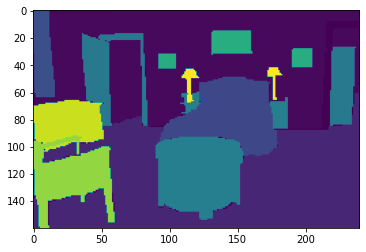

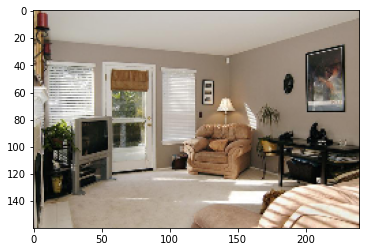

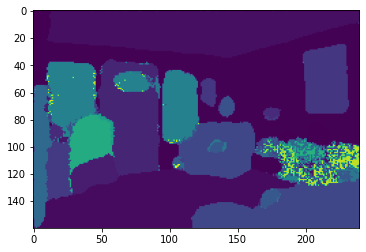

...

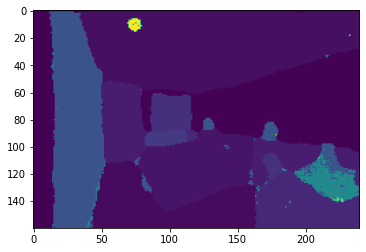

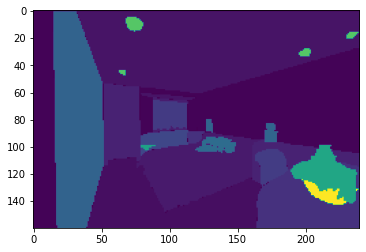

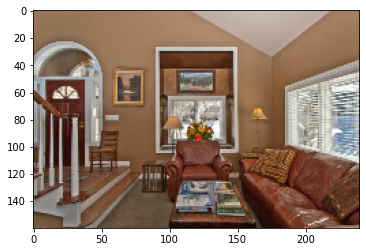

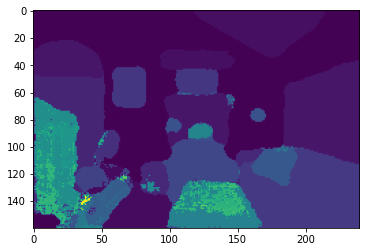

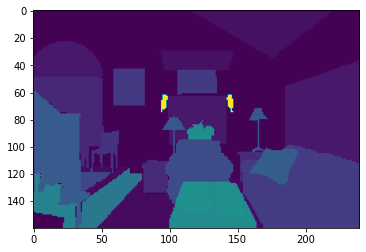

  0%|          | 0/13 [00:00<?, ?it/s]




epoch: 120 | train_loss: 1.5794 | train_acc: 0.8930

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 121 | train_loss: 1.5916 | train_acc: 0.8957

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 122 | train_loss: 1.5782 | train_acc: 0.8963

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 123 | train_loss: 1.6013 | train_acc: 0.8913

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 124 | train_loss: 1.5822 | train_acc: 0.8936

Train Loop:



100%|██████████| 13/13 [00:07<00:00,  1.73it/s]


Displaying images:



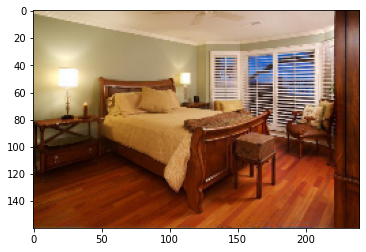

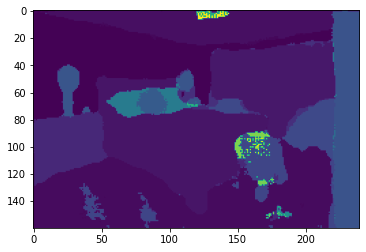

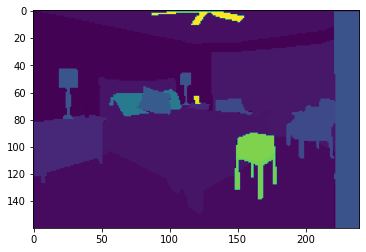

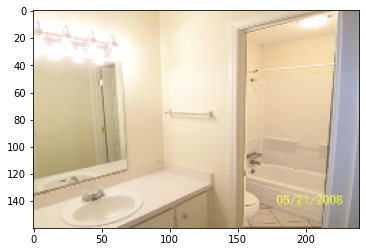

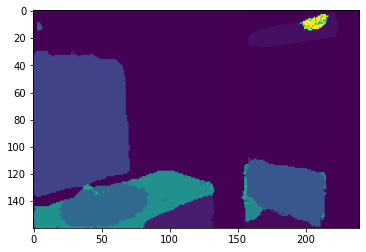

...

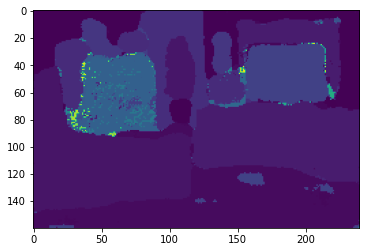

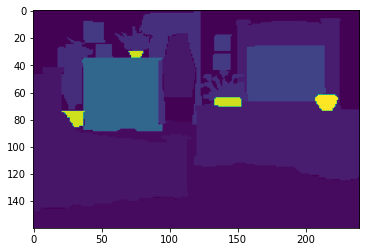

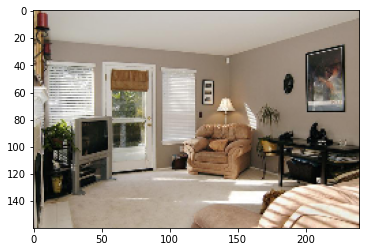

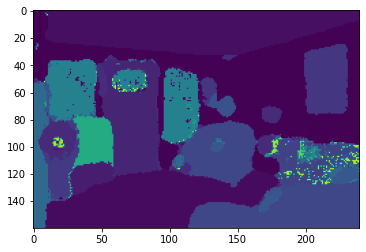

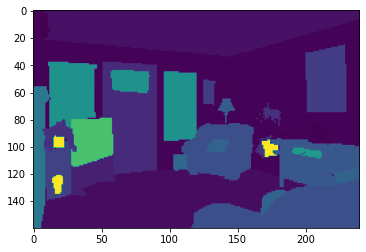

  0%|          | 0/13 [00:00<?, ?it/s]




epoch: 125 | train_loss: 1.6079 | train_acc: 0.8917

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 126 | train_loss: 1.5688 | train_acc: 0.8943

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 127 | train_loss: 1.5462 | train_acc: 0.8994

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 128 | train_loss: 1.5592 | train_acc: 0.9032

Train Loop:



  0%|          | 0/13 [00:00<?, ?it/s]



epoch: 129 | train_loss: 1.5572 | train_acc: 0.8984

Train Loop:



100%|██████████| 13/13 [00:07<00:00,  1.72it/s]


Displaying images:



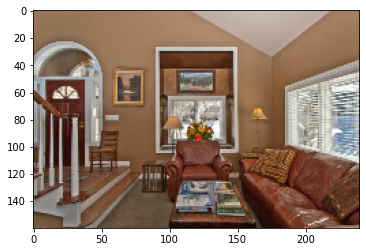

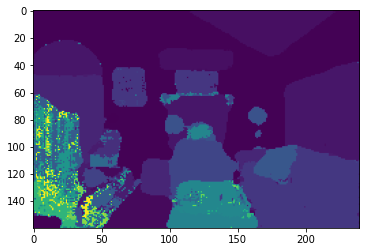

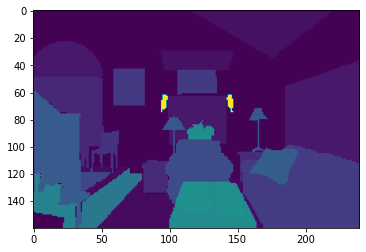

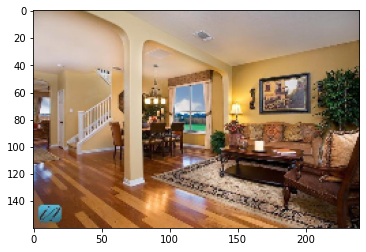

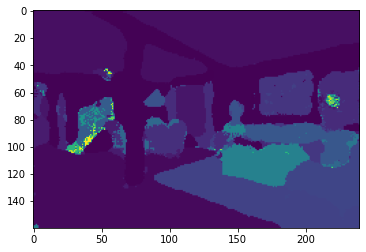

...

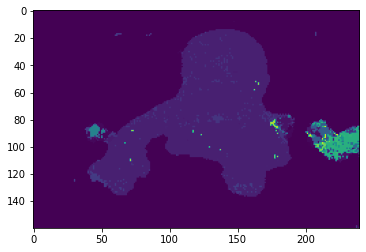

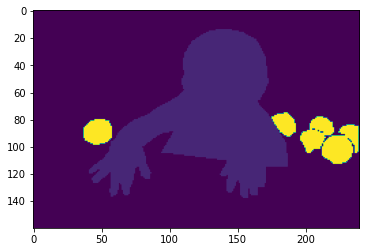

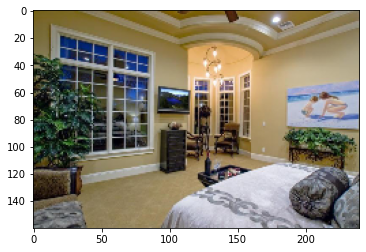

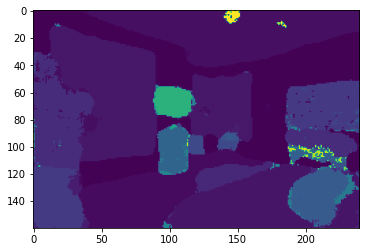

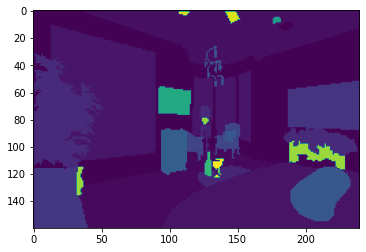

  0%|          | 0/13 [00:00<?, ?it/s]




epoch: 130 | train_loss: 1.5506 | train_acc: 0.9030

Train Loop:



 54%|█████▍    | 7/13 [00:04<00:04,  1.48it/s]


KeyboardInterrupt: ignored

In [31]:
for epoch in range(epochs):
    train_loss, train_acc = loop(train_batches, net, True)
    # val_loss, val_acc, val_dice_score = loop(train_batches, net, False)
    # print(f"epoch: {epoch} | train_loss: {train_loss:.4f} | train_acc: {train_acc:.4f} | train_dice_score: {train_dice_score:.4f} | val_loss: {val_loss:.4f} | val_acc: {val_acc:.4f} | val_dice_score: {val_dice_score:.4f}")
    print(f"epoch: {epoch} | train_loss: {train_loss:.4f} | train_acc: {train_acc:.4f}")
    print("")

In [32]:
def segment_images(img_ids):
    print("Displaying images:")
    print("")
    net.eval()
    for img_id in img_ids:
        x = train_data[img_id][0].unsqueeze(0).to(device)
        gt = train_data[img_id][1]
        with torch.no_grad():
            pred = net(x)

        pred = pred.softmax(1).argmax(1)
        plt.imshow(x[0].permute(1, 2, 0).cpu())
        plt.show()
        plt.imshow(gt)
        plt.show()
        plt.imshow(pred[0, :, :].detach().cpu())
        plt.show()
        print("")

Displaying images:



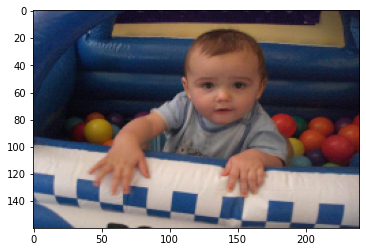

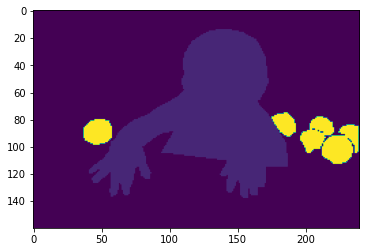

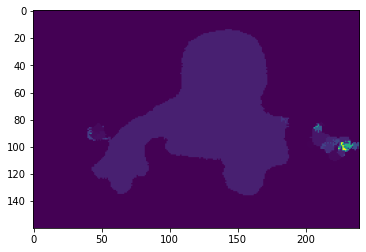

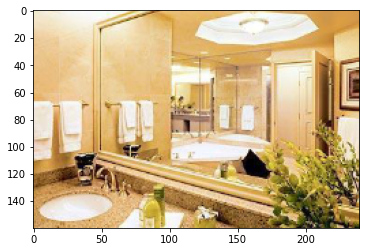

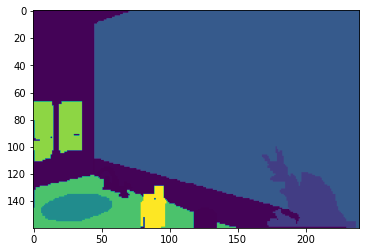

...

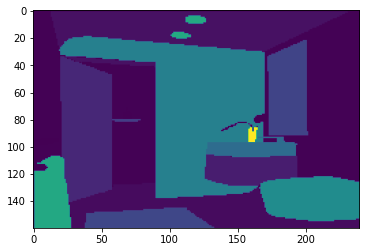

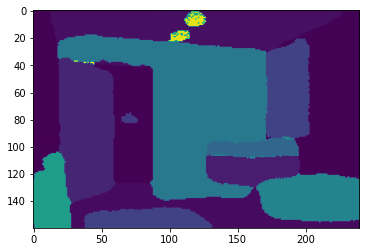

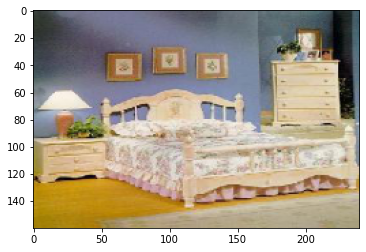

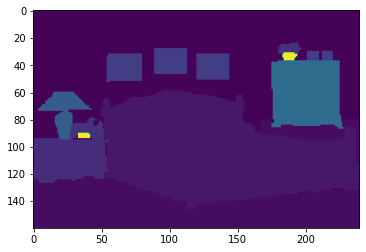

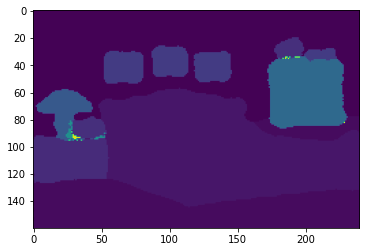

In [35]:
segment_images([4, 10, 40, 69])